In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage import color, morphology
from skimage import data

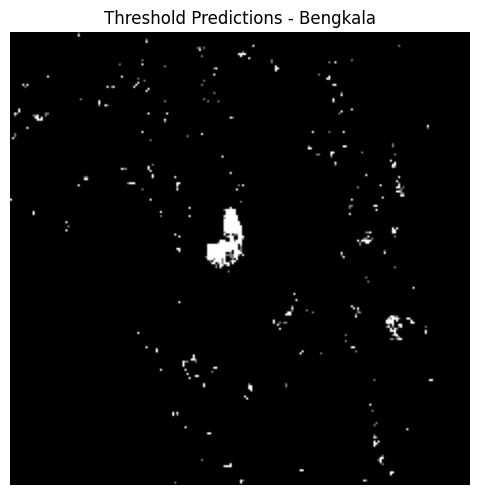

In [211]:
img = Image.open('../../test_output_2.png')
img = np.asarray(img)
img = color.rgb2gray(img)
plt.figure(figsize=(6,6), dpi=100)
plt.title('Threshold Predictions - Bengkala')
plt.imshow(img, cmap='gray')
plt.axis('off');

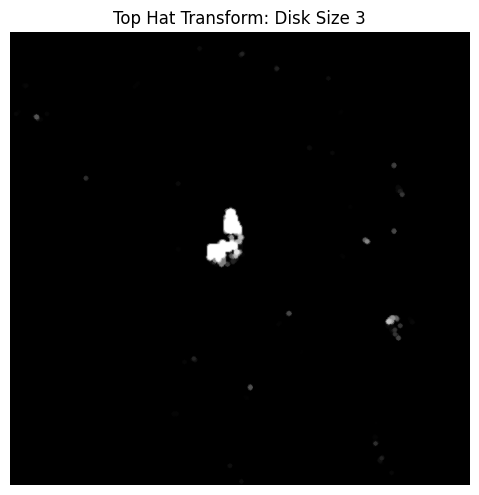

In [207]:
disk_size = 3
selem =  morphology.disk(disk_size)
res = morphology.white_tophat(img, selem)
filtered_img = img - res
plt.figure(figsize=(6,6), dpi=100)
plt.imshow(filtered_img, cmap='gray')
plt.axis('off')
plt.title('Top Hat Transform: Disk Size ' + str(disk_size))
plt.show()

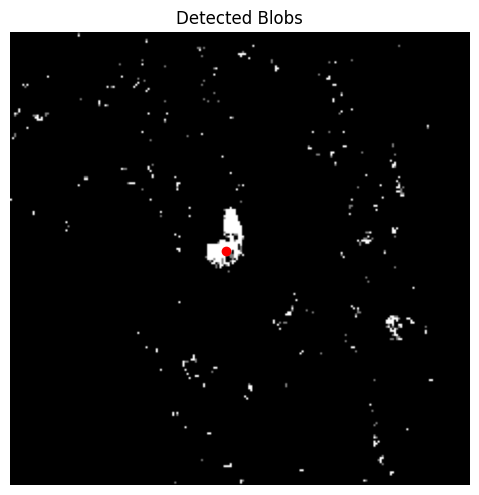

In [212]:
img = Image.open('../../test_output_2.png')
img = np.asarray(img)
img = color.rgb2gray(img)
from skimage.feature import blob_dog, blob_log, blob_doh
blobs = blob_doh(img, min_sigma=20, max_sigma=30, threshold=.03)
plt.figure(figsize=(6,6), dpi=100)
plt.imshow(img, cmap='gray')
for blob in blobs:
    plt.scatter(blob[1], blob[0], c='r')
plt.axis('off')
plt.title('Detected Blobs')
plt.show()

In [4]:
from skimage.util import invert
source_img = Image.open('/Users/ckruse/Downloads/tpa_nn_toa_resamp_v2.jpg')
source_img = np.asarray(source_img)
source_img = invert(color.rgb2gray(source_img))
#plt.imshow(img, cmap='gray')
#plt.axis('off');
print(img.shape)

UnidentifiedImageError: cannot identify image file '../../tpa_nn_toa_v8_webmerc.tif'

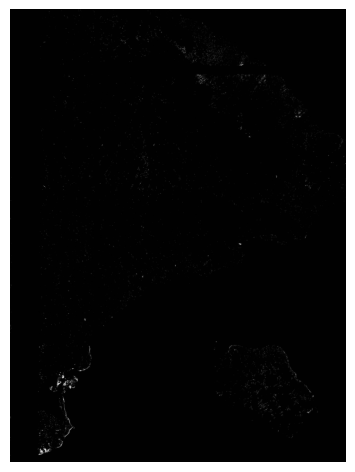

In [179]:
img = source_img[500:, 4000:7000]
plt.figure(figsize=(6,6), dpi=100)
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.show()

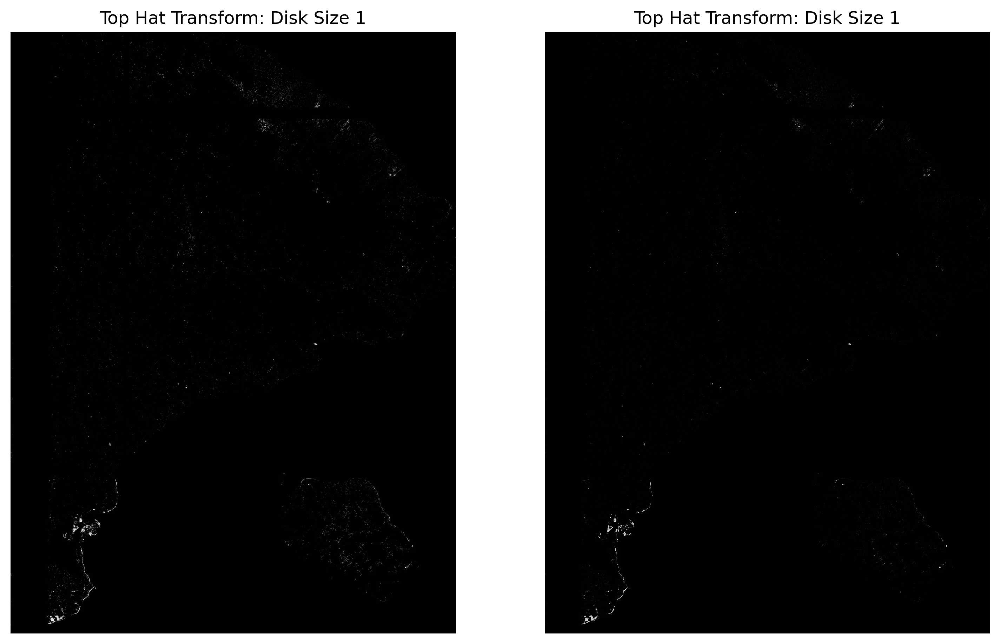

In [183]:
disk_size = 1
selem =  morphology.disk(disk_size)
res = morphology.white_tophat(img, selem)
filtered_img = img - res
plt.figure(figsize=(12,12), dpi=300)
plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.title('Top Hat Transform: Disk Size ' + str(disk_size))
plt.subplot(1,2,2)
plt.imshow(filtered_img, cmap='gray', vmin=0, vmax=1, interpolation='none')
plt.axis('off')
plt.title('Top Hat Transform: Disk Size ' + str(disk_size))
plt.show()

In [197]:
from skimage.feature import blob_dog, blob_log, blob_doh
blobs = blob_doh(source_img, min_sigma=5, max_sigma=50, threshold=.01)

In [200]:
satellite_img = Image.open('/Users/ckruse/Downloads/bali_3857_resamp_v2_stretched.png')

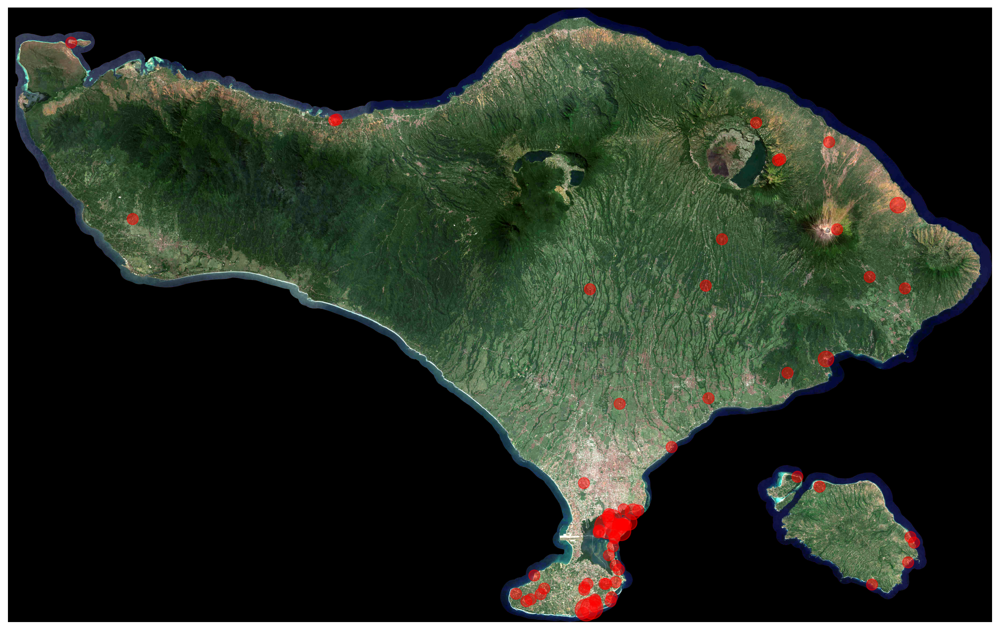

In [205]:
plt.figure(figsize=(16,16), dpi=200)
plt.imshow(satellite_img)
for blob in blobs:
    plt.scatter(blob[1], blob[0], c='r', s= 20 * blob[2], alpha=0.5)
plt.axis('off')
#plt.title('Blob Detection on Heatmap Outputs')
plt.savefig('figures/blob_detection.png', bbox_inches='tight')
plt.show()

In [189]:
blob[2]

10.0

In [190]:
import rasterio as rs
from rasterio.plot import show
from rasterio import warp

In [211]:
def pixels_to_coords(x, y, src_img):
    lon, lat = warp.transform(src_img.crs, rs.crs.CRS.from_epsg(4326), [src_img.xy(x, y)[0]], [src_img.xy(x, y)[1]])
    return lon[0], lat[0]

def coords_to_pixels(lon, lat, src_img):
    x, y = warp.transform(rs.crs.CRS.from_epsg(4326), src_img.crs, [lon],  [lat])
    pixel_y, pixel_x = src_img.index(x, y)
    return pixel_x[0], pixel_y[0]
    

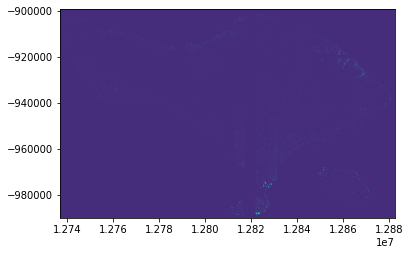

<AxesSubplot:>

In [144]:
source = rs.open('../../tpa_nn_toa_v8_webmerc.tif')

In [113]:
satellite_img = np.array(Image.open('../../bali_webmerc_clip.jpg'))
satellite_img.shape

(9106, 14571, 3)

In [145]:
preds_median = source.read(1)
print(preds_median.shape)

(9105, 14569)


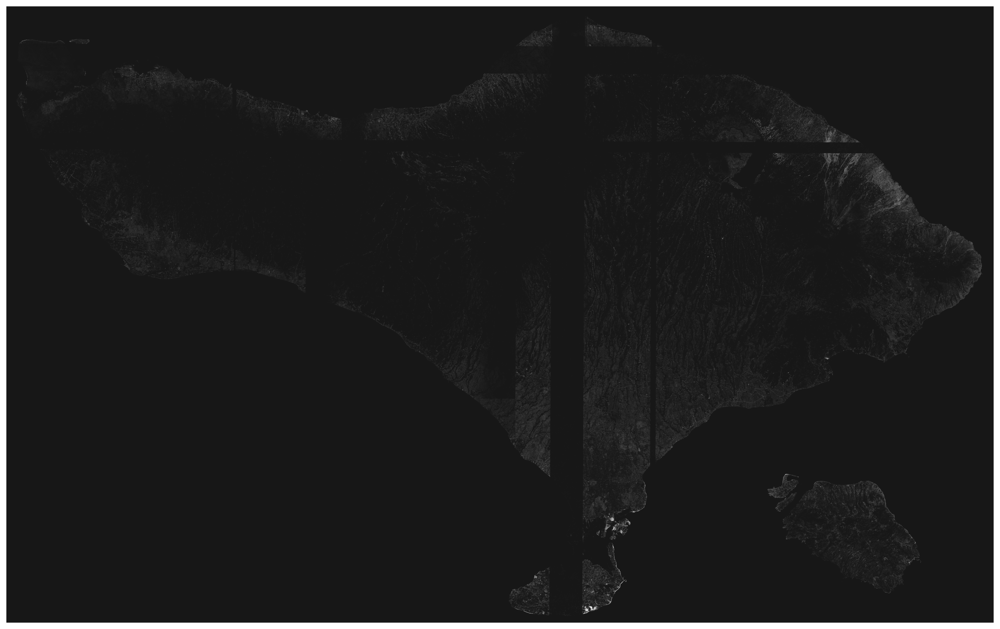

In [303]:
plt.figure(figsize=(20,20), dpi=200)
plt.imshow(source.read(2), cmap='gray')
plt.axis('off')
plt.show()

In [198]:
# Load TPA dataset
import json
import pandas as pd

with open('../data/tpa_points.json') as f:
    tpa_points = json.load(f)
    f.close()

tpa_sites = pd.DataFrame({
    'name': [site['properties']['Name'] for site in tpa_points['features']],
    'lon': [site['geometry']['coordinates'][0] for site in tpa_points['features']],
    'lat': [site['geometry']['coordinates'][1] for site in tpa_points['features']],
    'area': [site['properties']['Surface_Ha'] for site in tpa_points['features']],
    'daily_volume': [site['properties']['TOT_Kg/Day'] for site in tpa_points['features']],
    'coords': [site['geometry']['coordinates'] for site in tpa_points['features']]
})

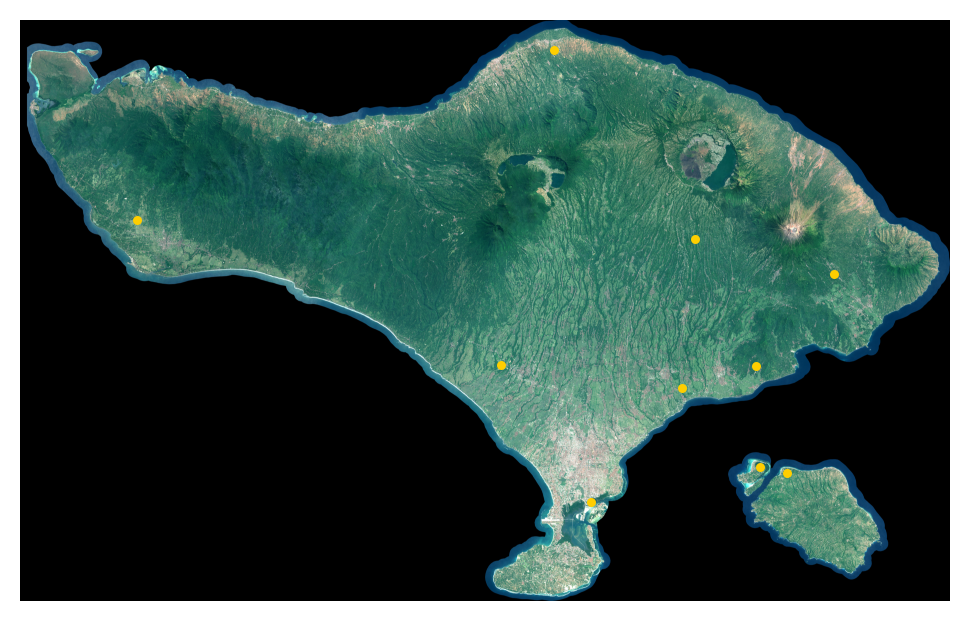

In [213]:
plt.figure(dpi=200)
plt.imshow(satellite_img)
for lon, lat in zip(tpa_sites['lon'], tpa_sites['lat']):
    x, y = coords_to_pixels(lon, lat, preds)
    plt.scatter(x, y, c='#FFCE00', s=5)
plt.axis('off')
plt.show()

In [297]:
preds.width

14569

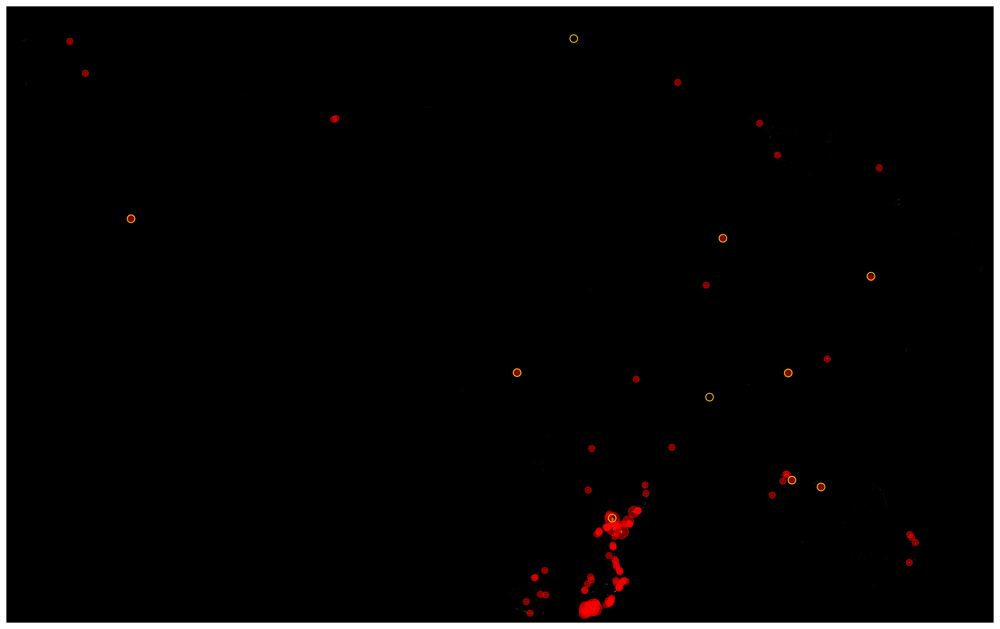

In [304]:
from skimage.feature import blob_dog, blob_log, blob_doh

min_y = 0
max_y = preds.height
min_x = 0
max_x = preds.width

subset = preds_median[min_y:max_y, min_x:max_x].astype('double')
mask = np.ma.masked_where(subset < 0.5, subset).mask
subset[mask] = 0

blobs = blob_doh(subset, min_sigma=5, max_sigma=100, threshold=.015)
plt.figure(figsize=(20,20), dpi=200)
plt.imshow(subset, cmap='gray')
plt.scatter(blobs[:,1], blobs[:,0], c='r', s=10 * blobs[:,2], alpha=0.5)
for lon, lat in zip(tpa_sites['lon'], tpa_sites['lat']):
    x, y = coords_to_pixels(lon, lat, preds)
    plt.scatter(x - min_x, y - min_y, facecolors='none', edgecolors='#FFCE00', s=75)
plt.xlim([0, max_x - min_x])
plt.ylim([max_y - min_y, 0])
plt.axis('off')
plt.savefig('figures/bali_heatmaps/bali_scatter.png', bbox_inches='tight')
plt.show()

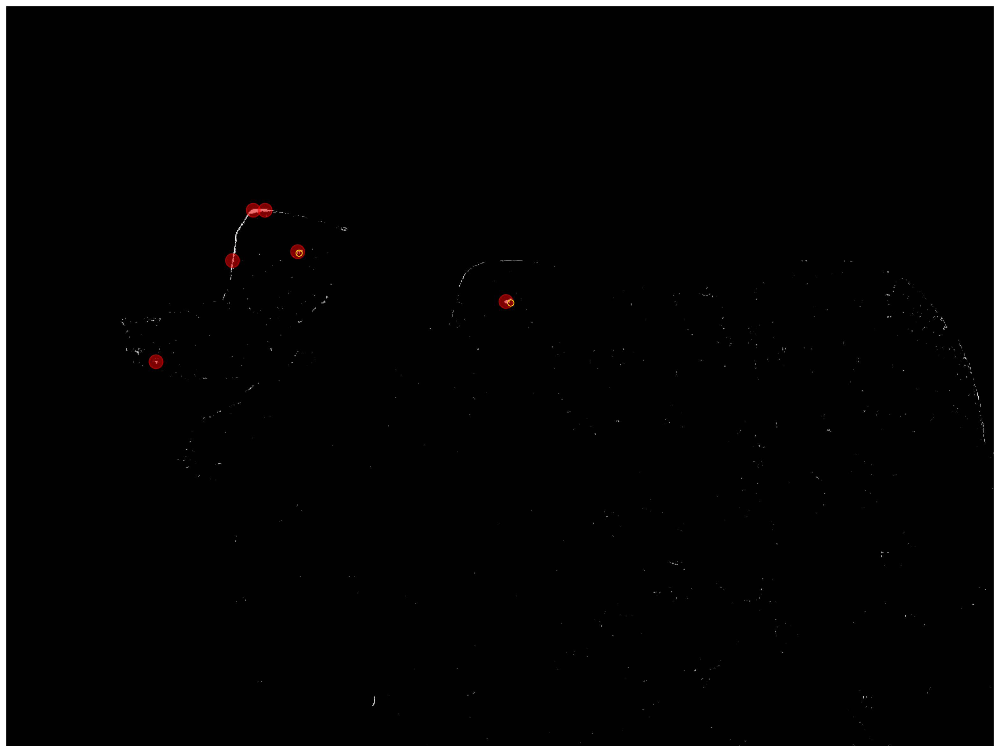

In [293]:
from skimage.feature import blob_dog, blob_log, blob_doh

min_y = 6500
max_y = 8000
min_x = 11000
max_x = 13000


subset = preds_median[min_y:max_y, min_x:max_x].astype('double')
mask = np.ma.masked_where(subset < 0.5, subset).mask
subset[mask] = 0

blobs = blob_doh(subset, min_sigma=5, max_sigma=100, threshold=.015)
plt.figure(figsize=(20,20), dpi=200)
plt.imshow(subset, cmap='gray')
#plt.imshow(satellite_img[min_y:max_y, min_x:max_x])
plt.scatter(blobs[:,1], blobs[:,0], c='r', s=50 * blobs[:,2], alpha=0.5)
for lon, lat in zip(tpa_sites['lon'], tpa_sites['lat']):
    x, y = coords_to_pixels(lon, lat, preds)
    plt.scatter(x - min_x, y - min_y, facecolors='none', edgecolors='#FFCE00', s=50)
plt.xlim([0, max_x - min_x])
plt.ylim([max_y - min_y, 0])
plt.axis('off')
plt.show()

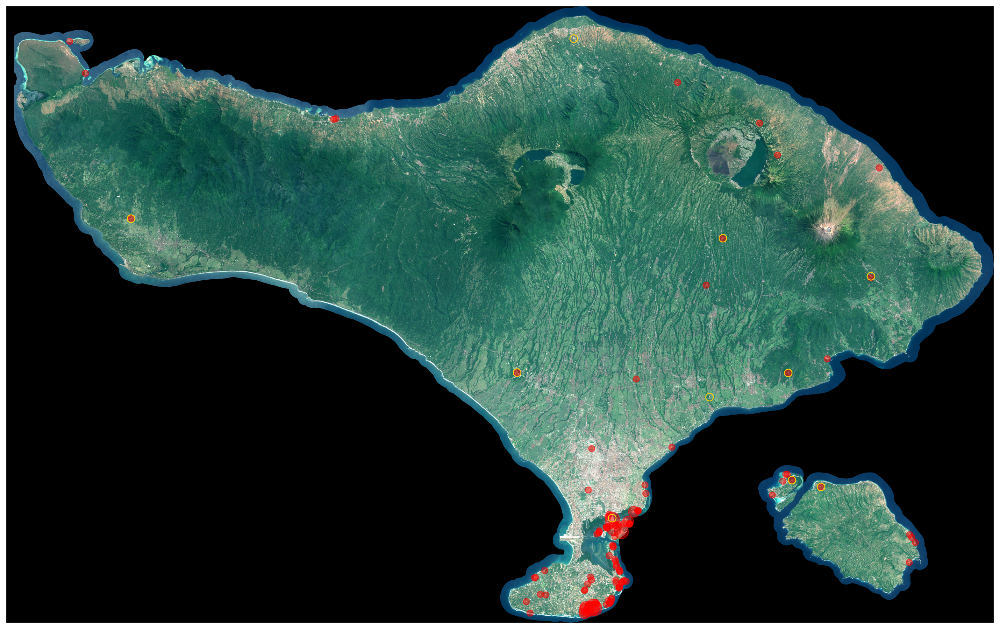

In [309]:
min_y = 0
max_y = preds.height
min_x = 0
max_x = preds.width

plt.figure(figsize=(20,20), dpi=200)
plt.imshow(satellite_img)
plt.scatter(blobs[:,1], blobs[:,0], c='r', s=10 * blobs[:,2], alpha=0.5)
for lon, lat in zip(tpa_sites['lon'], tpa_sites['lat']):
    x, y = coords_to_pixels(lon, lat, preds)
    plt.scatter(x - min_x, y - min_y, facecolors='none', edgecolors='#FFCE00', s=75)
plt.xlim([0, max_x - min_x])
plt.ylim([max_y - min_y, 0])
plt.axis('off')
#plt.savefig('figures/bali_heatmaps/bali_satellite.png', bbox_inches='tight')
plt.show()

In [315]:
import geojson

In [347]:
candidate_points = []
candidate_coords = []
for i, blob in enumerate(blobs):
    candidate_coords.append(pixels_to_coords(blob[0], blob[1], preds))
    candidate_points.append(geojson.Feature(geometry = geojson.Point(pixels_to_coords(blob[0], blob[1], preds)),
                                            properties={'name': f"Point {i}"}))

feature_collection = geojson.FeatureCollection(candidate_points)


In [343]:
dump = geojson.dumps(feature_collection)
with open('../web_map/candidate_points.geojson', 'w') as f:
    f.write(dump)

In [345]:
tpa_points = []
for index in range(len(tpa_sites)):
    site=tpa_sites.iloc[index]
    tpa_points.append(geojson.Feature(geometry=geojson.Point(site['coords']),
                                      properties={'name': site['name']}
                                     ))
tpa_collection = geojson.FeatureCollection(tpa_points)

dump = geojson.dumps(tpa_collection)
with open('../web_map/tpa_coords.geojson', 'w') as f:
    f.write(dump)

In [353]:
bootstrap_indices = [39, 35, 113, 68, 11, 45, 110, 15, 80, 21, 71, 83, 41, 87,
                    111, 89, 32, 64, 112, 86, 0, 37, 90, 85, 77, 94, 30, 54, 65,
                    30, 78, 92, 47, 76, 50, 25, 49, 18, 91, 60, 29, 88, 106, 67, 
                    103, 48, 34]

In [363]:
bootstrap_points = []
for point in np.array(candidate_coords)[bootstrap_indices]:
    bootstrap_points.append(geojson.Feature(geometry=geojson.Point((point[0], point[1]))))

bootstrap_collection = geojson.FeatureCollection(bootstrap_points)
dump = geojson.dumps(bootstrap_collection)
with open('../data/training_sites/bootstrap_negatives.geojson', 'w') as f:
    f.write(dump)

In [368]:
to_investigate = [27, 36, 5, 10, 105, 43, 69, 82, 38, 2, 72, 81]

for index in to_investigate:
    print(str(candidate_coords[index][1]) + ',', candidate_coords[index][0])

-8.830271933012636, 115.10730523806751
-8.820773763956181, 115.12599019597721
-8.821483915891617, 115.13308688672176
-8.833023693314106, 115.20055036455913
-8.831070833280013, 115.19920289163294
-8.81571389188639, 115.18438068944496
-8.807191845455932, 115.18860277128034
-8.801865466693595, 115.1936333368714
-8.798048181414222, 115.19255535853048
-8.728442420810461, 115.23612364981027
-8.629604822204588, 115.19399266298507
-8.136901826183822, 114.52277148269096
